# Marcov Chain Monte Carlo sampling of abstract combinatorial structure

This code demonstates an adaption of the Metropolis-Hasting (MH) algorithm for sampling constraint combinatorial objects, specifically knowledge spaces. This adresses a problem which is not solvable through analytical means and RS and IM are not applicable.

The goal is to take a representative sample of all possible knowledge structures (constrained grafs). For small domain size parameters (n<6) enumeration is possible, so we can compare statistics about the ground truth set of structures (our target distributions) and the sampled set of structures.

In [ ]:
# Reload all modules in case they are under development
import importlib
from pathlib import Path
from collections import Counter
import os
import ast
import pickle
from dkst.utils import KST_utils, DKST_utils, set_operations, relations
from dkst import dkst_datasets, mcmc_sampling, models

# Reload each module
importlib.reload(KST_utils)
importlib.reload(DKST_utils)
importlib.reload(set_operations)
importlib.reload(relations)
importlib.reload(dkst_datasets)
importlib.reload(models)
importlib.reload(mcmc_sampling)

# Import everything from the modules
from dkst.utils.KST_utils import *
from dkst.utils.DKST_utils import *
from dkst.utils.set_operations import *
from dkst.utils.relations import *
from dkst.dkst_datasets import *
from dkst.models import *
from dkst.mcmc_sampling import *

import gc
from torch.utils.data import DataLoader, random_split, ConcatDataset
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

print("Modules reloaded and re-imported successfully.")
config_path = os.path.abspath("../data/config/config_data_06.json")


Modules reloaded and re-imported successfully.


### Sampling knowledge spaces 

In [ ]:
# Sampling knowledge structures for a 5-item domain:
initial_states = ['', 'b', 'c', 'ab', 'ac', 'ad', 'bc', 'bd', 'cd', 'abc', 'abd', 'acd', 'bcd', 'abcd', 'abcde'] # optionally define your own initial structure
initial_K = union_closure(initial_states)
print("Initial knowledge space:", sort_K(initial_K))
print()

log_path = os.path.join("../data/outputs", "mcmc_sampling.log")

In [ ]:
samples = sample_multiple_knowledge_spaces(initial_K, steps_between=250, total_samples=200, perm_prob=0.02, log=True)
print("\nTotal samples collected:", len(samples))


Initial knowledge space: ['', 'b', 'c', 'ab', 'ac', 'ad', 'bc', 'bd', 'cd', 'abc', 'abd', 'acd', 'bcd', 'abcd', 'abcde']



Sampling knowledge spaces:  10%|█         | 20/200 [00:14<02:04,  1.44it/s]

Sample 20: ['', 'c', 'd', 'ae', 'cd', 'abd', 'abe', 'ace', 'ade', 'bcd', 'bce', 'bde', 'cde', 'abcd', 'abce', 'abde', 'acde', 'bcde', 'abcde']


Sampling knowledge spaces:  20%|██        | 40/200 [00:27<01:58,  1.35it/s]

Sample 40: ['', 'c', 'e', 'ac', 'ce', 'abc', 'ace', 'bce', 'cde', 'abce', 'abde', 'acde', 'bcde', 'abcde']


Sampling knowledge spaces:  30%|███       | 60/200 [00:41<01:43,  1.35it/s]

Sample 60: ['', 'ad', 'be', 'ce', 'abc', 'acd', 'ace', 'bce', 'bde', 'abcd', 'abce', 'abde', 'acde', 'bcde', 'abcde']


Sampling knowledge spaces:  40%|████      | 80/200 [00:53<01:24,  1.43it/s]

Sample 80: ['', 'b', 'ac', 'abc', 'bcd', 'bde', 'abcd', 'abde', 'acde', 'bcde', 'abcde']


Sampling knowledge spaces:  50%|█████     | 100/200 [01:07<01:11,  1.40it/s]

Sample 100: ['', 'c', 'd', 'ac', 'ad', 'bd', 'be', 'cd', 'ce', 'abc', 'abd', 'acd', 'ace', 'ade', 'bcd', 'bce', 'bde', 'cde', 'abcd', 'abce', 'abde', 'acde', 'bcde', 'abcde']


Sampling knowledge spaces:  60%|██████    | 120/200 [01:20<00:50,  1.57it/s]

Sample 120: ['', 'd', 'ad', 'be', 'cd', 'de', 'abc', 'abd', 'abe', 'acd', 'ade', 'bce', 'bde', 'cde', 'abcd', 'abce', 'abde', 'acde', 'bcde', 'abcde']


Sampling knowledge spaces:  70%|███████   | 140/200 [01:34<00:48,  1.24it/s]

Sample 140: ['', 'c', 'acd', 'cde', 'acde', 'abcde']


Sampling knowledge spaces:  80%|████████  | 160/200 [01:47<00:27,  1.45it/s]

Sample 160: ['', 'e', 'ae', 'bd', 'be', 'de', 'abc', 'abd', 'abe', 'acd', 'ade', 'bde', 'abcd', 'abce', 'abde', 'acde', 'bcde', 'abcde']


Sampling knowledge spaces:  90%|█████████ | 180/200 [01:59<00:10,  1.84it/s]

Sample 180: ['', 'c', 'e', 'ac', 'ae', 'ce', 'ace', 'bce', 'abce', 'abde', 'acde', 'bcde', 'abcde']


Sampling knowledge spaces: 100%|██████████| 200/200 [02:13<00:00,  1.50it/s]

Sample 200: ['', 'ab', 'ae', 'abc', 'abd', 'abe', 'ace', 'bcd', 'bce', 'bde', 'abcd', 'abce', 'abde', 'bcde', 'abcde']

Total samples collected: 200


### Vizualizing the Marcov Chain

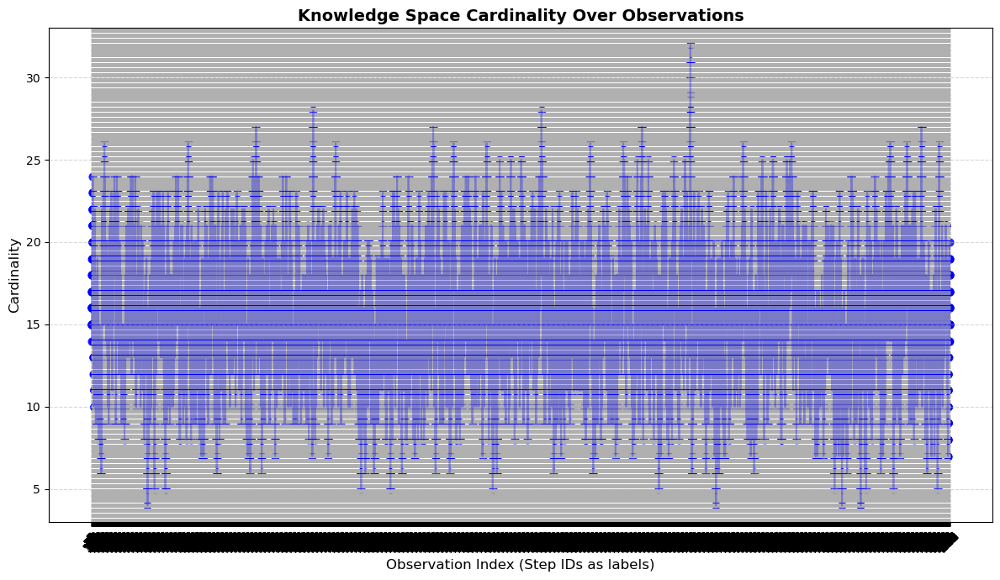

In [ ]:
# Read the Marcov Chain from the log file and plot relevant sample statistics

def extract_cardinalities(log_path):
    """
    Extracts step IDs and corresponding cardinalities from a log file of the marcov chain.
    
    The log file is expected to have lines of the form:
        Step X: [<knowledge space as a list of subset strings>]
        
    :param log_path: Path to the log file.
    :type log_path: str
    :return: A dictionary mapping each step (int) to its cardinality (int).
    :rtype: dict[int, int]
    """
    import ast
    card_entries = []
    with open(log_path, 'r') as f:
        for line in f:
            line = line.strip()
            if line.startswith("Step"):
                try:
                    step_part, list_part = line.split(":", 1)
                    step = int(step_part.split()[1])
                    ks = ast.literal_eval(list_part.strip())
                    card_entries.append((step, len(ks)))
                except Exception as e:
                    print(f"Error processing line: {line}\n{e}")
    return card_entries

def plot_cardinalities(card_entries):
    """
    Plots the cardinalities over observations using matplotlib.
    
    This function expects a list of tuples (step, cardinality) from the log file. 
    The x-axis displays the observation index with the corresponding step
    IDs as tick labels.
    
    :param card_entries: List of tuples (step, cardinality) in order of appearance.
    :type card_entries: list[tuple[int, int]]
    """

    # Extract steps and cardinalities in order of appearance
    steps = [entry[0] for entry in card_entries]
    card_values = [entry[1] for entry in card_entries]
    
    # Steps in the marcov chain
    x = list(range(len(steps)))
    
    plt.figure(figsize=(12, 7))
    
    # Draw a line and overlay scatter points.
    plt.plot(x, card_values, linestyle='-', color='blue', alpha=0.3)
    plt.scatter(x, card_values, marker='o', s=40, color='blue', alpha=0.8)
    plt.xlabel("Observation Index (Step IDs as labels)", fontsize=12)
    plt.ylabel("Cardinality", fontsize=12)
    plt.title("Knowledge Space Cardinality Over Observations", fontsize=14, fontweight='bold')
    plt.grid(True, alpha=0.5, linestyle='--')
    plt.xticks(ticks=x, labels=steps, rotation=45)
    y_min, y_max = min(card_values), max(card_values) # Adjust y-limits for clarity.
    plt.ylim(y_min - 1, y_max + 1)
    plt.tight_layout()
    plt.show()

# Plot the whole chain of obects by cardinality 
card_dict = extract_cardinalities(log_path)
plot_cardinalities(card_dict)

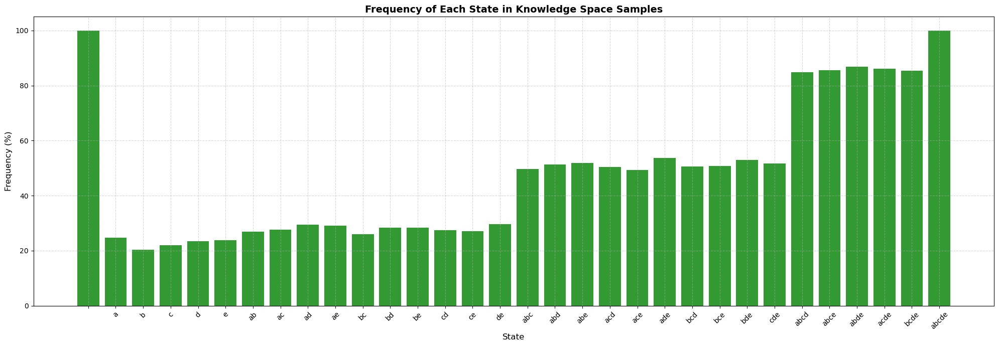

In [ ]:
def extract_states(log_path):
    """
    Extracts all states of the marcov chain from a log file and 
    returns a list of knowledge spaces (each a list of state strings) 
    in the order they appear.
    
    The log file is expected to have lines of the form:
        Step X: [<knowledge space as a list of subset strings>]

    :param log_path: Path to the log file.
    :type log_path: str
    :return: List of knowledge spaces.
    :rtype: list[list[str]]
    """
    import ast
    states_list = []
    with open(log_path, 'r') as f:
        for line in f:
            line = line.strip()
            if line.startswith("Step"):
                try:
                    _, list_part = line.split(":", 1)
                    ks = ast.literal_eval(list_part.strip())
                    states_list.append(ks)
                except Exception as e:
                    print(f"Error processing line: {line}\n{e}")
    return states_list

def compute_state_frequencies(log_path):
    """
    Computes the frequency (as percentage) of each state appearing in the knowledge spaces 
    extracted from given log file.

    :param log_path: Path to the log file.
    :type log_path: str
    :return: Dictionary mapping each state (string) to its frequency percentage.
    :rtype: dict[str, float]
    """
    states_list = extract_states(log_path)
    total_samples = len(states_list)
    freq = {}
    for ks in states_list:
        for state in ks:
            freq[state] = freq.get(state, 0) + 1
    # Convert counts to percentages.
    for state in freq:
        freq[state] = (freq[state] / total_samples) * 100
    return freq

def plot_state_frequencies(state_freq_dict):
    """
    Plots a bar plot of the state frequencies (in percentage) from the knowledge space samples.
    The x-axis represents the state (subset string) and the y-axis the frequency percentage.
    The states are sorted using the sort_K function for a consistent, canonical order.
    
    :param state_freq_dict: Dictionary mapping state strings to frequency percentages.
    :type state_freq_dict: dict[str, float]
    """
    # Sort states using sort_K.
    states = sort_K(list(state_freq_dict.keys()))
    percentages = [state_freq_dict[s] for s in states]
    
    plt.figure(figsize=(20, 7))
    plt.bar(states, percentages, color='green', alpha=0.8)
    plt.xlabel("State", fontsize=12)
    plt.ylabel("Frequency (%)", fontsize=12)
    plt.title("Frequency of Each State in Knowledge Space Samples", fontsize=14, fontweight='bold')
    plt.xticks(rotation=45, fontsize=10)
    plt.yticks(fontsize=10)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

# Plot knowledge state frequencies for the whole chain of obects 
freq_dict = compute_state_frequencies(log_path)
plot_state_frequencies(freq_dict)


### Vizualizing the samples after thinning

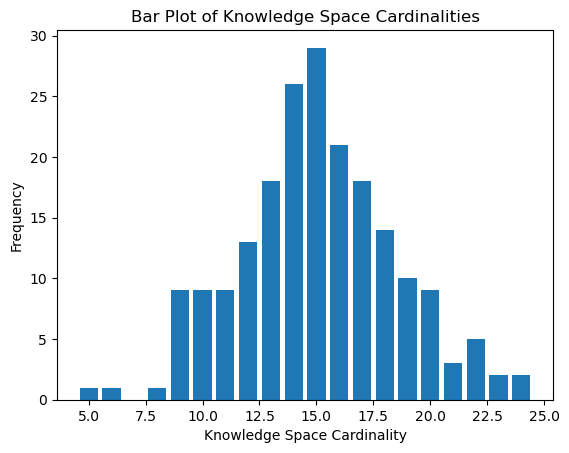

In [11]:
# Compute the cardinalities of the sampled knowledge spaces
cardinalities = [len(s) for s in samples]

card_counts = Counter(cardinalities)
plt.bar(card_counts.keys(), card_counts.values())
plt.xlabel("Knowledge Space Cardinality")
plt.ylabel("Frequency")
plt.title("Bar Plot of Knowledge Space Cardinalities")
plt.show()

In [13]:
def animate_histogram_cardinalities(log_path, max_frames=300, skip_structures=5): 
    """
    Extracts all states of the marcov chain from a log file and 
    and creates a growing histogram animation.
    
    The log file is expected to have lines of the form:
        Step X: [<knowledge space as a list of subset strings>]

    The x-axis represents the cardinality (number of states) and the y-axis shows their frequency,
    computed over the observations up to each frame. If there are more observations than max_frames,
    frames will be skipped to keep the animation responsive.
    The Marcov chain is thinned according to skip_structures.
    
    :param log_path: Path to the log file.
    :type log_path: str
    :param max_frames: Maximum number of frames to animate.
    :type max_frames: int
    :skip_structures: Number of knowledge structures to skip in the marcov chain, to try out different thinning strengths.
    :type skip_structures: int
    :return: A FuncAnimation object.
    :rtype: matplotlib.animation.FuncAnimation
    """

    # --- Extraction ---
    card_entries = []
    counter = 0
    with open(log_path, 'r') as f:
        for line in f:
            counter += 1
            if counter <= skip_structures:
                continue
            else:
                counter = 0
            line = line.strip()
            if line.startswith("Step"):
                try:
                    step_part, list_part = line.split(":", 1)
                    step = int(step_part.split()[1])
                    ks = ast.literal_eval(list_part.strip())
                    card_entries.append((step, len(ks)))
                except Exception as e:
                    print(f"Error processing line: {line}\n{e}")
    
    if not card_entries:
        print("No valid data found in log file.")
        return None

    # Use only the cardinality values in file order.
    card_values = [entry[1] for entry in card_entries]
    final_min = min(card_values)
    final_max = max(card_values)
    # Define histogram bins covering the full range of cardinalities.
    bins = np.arange(final_min, final_max + 2)  # bin edges

    total_frames = len(card_values)
    if max_frames is None:
        frame_indices = np.arange(total_frames)
    elif total_frames > max_frames:
        frame_indices = np.round(np.linspace(0, total_frames - 1, max_frames)).astype(int)
    else:
        frame_indices = np.arange(total_frames)
    
    fig, ax = plt.subplots(figsize=(12, 7))
    
    def init():
        ax.clear()
        ax.set_xlabel("Cardinality", fontsize=12)
        ax.set_ylabel("Frequency", fontsize=12)
        ax.set_title("Growing Histogram of Knowledge Space Cardinalities", fontsize=14, fontweight='bold')
        ax.set_xlim(final_min - 1, final_max + 1)
        # Initialize with zero frequency.
        ax.set_ylim(0, 10)
        ax.grid(True, alpha=0.5, linestyle='--')
        return []
    
    def update(frame_idx):
        ax.clear()
        real_idx = frame_indices[frame_idx]
        current_data = card_values[:real_idx + 1]
        freq, _ = np.histogram(current_data, bins=bins)
        x = bins[:-1]
        ax.bar(x, freq, width=0.9, color='blue', alpha=0.8)
        ax.set_xlabel("Cardinality", fontsize=12)
        ax.set_ylabel("Frequency", fontsize=12)
        ax.set_title("Growing Histogram of Knowledge Space Cardinalities", fontsize=14, fontweight='bold')
        ax.set_xlim(final_min - 1, final_max + 1)
        ax.set_ylim(0, max(freq) + 2)
        ax.grid(True, alpha=0.5, linestyle='--')
        return ax.patches

    ani = FuncAnimation(
        fig,
        update,
        frames=len(frame_indices),
        init_func=init,
        interval=100,
        repeat=False,
        blit=False
    )
    
    plt.tight_layout()
    # Prevent Matplotlib from displaying last static frame
    plt.close(fig)
    return ani


# Note: In Jupyter you may need to activate the interactive plt backend using %matplotlib notebook
log_path = os.path.join("../data/outputs", "mcmc_sampling.log")
ani = animate_histogram_cardinalities(log_path, max_frames=300, skip_structures=30)
HTML(ani.to_jshtml())

### Generate all structures 
In order to validate the representativeness of the sample, we enumerate all possible structures for a small domain size (up to 5 is possible)

In [20]:
# load or generate all structimport pickle

n = 4 # Choose the your domain size (up to 5)
file_path = (Path().resolve().parent / "data" / "outputs" / f"knowledge_structures_n{n}_union_closed.pkl")
with open(file_path, "rb") as f:
    try:
        structures_target = pickle.load(f)
    except Exception as e:
        print(f"Error loading knowledge structures: {e}")
        print("Generating new structures...")
        structures_target = generate_all_knowledge_structures(n, union_closed=True)
        with open(file_path, "wb") as f:
            pickle.dump(structures_target, f)
        print("New structures saved to:", file_path)


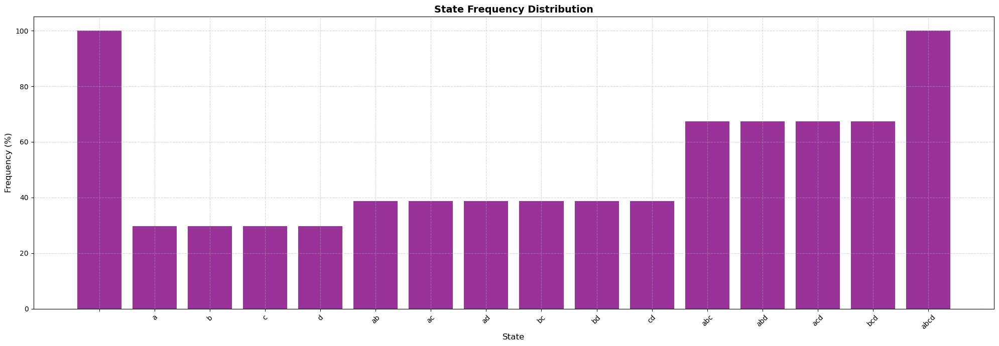

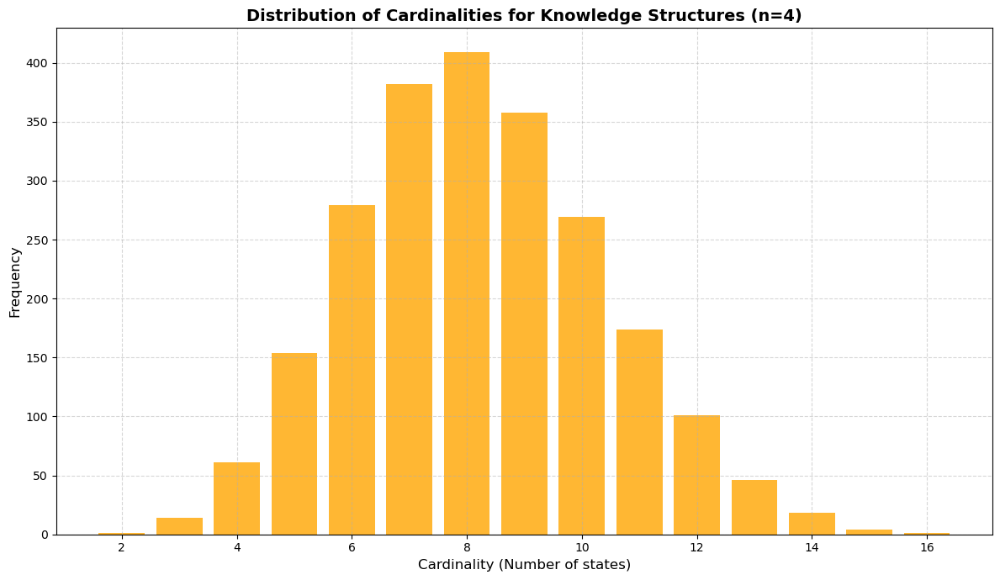

In [23]:
def plot_state_distribution(structures_target, figsize=(20,7)):
    """
    Computes the frequency (in percentage) of each state appearing in a list of knowledge structures 
    and plots bar plots (histograms), first a states-frequency plot, second a cardinality-freqeuncy plot.
    
    :param structures: List of knowledge structures (each structure is a list of state strings).
    :type structures: list[list[str]]
    :param figsize: Figure size for the plot.
    :type figsize: tuple
    """
    total_structures = len(structures_target)
    # Count state occurrences over all structures.
    state_counts = Counter(state for structure in structures_target for state in structure)
    # Convert to percentage.
    state_freq_percent = {state: (count / total_structures) * 100 for state, count in state_counts.items()}
    # Sort states 
    unsorted_states = list(state_freq_percent.keys())
    sorted_states = sort_K(unsorted_states)
    percentages_sorted = [state_freq_percent[s] for s in sorted_states]

    plt.figure(figsize=figsize)
    plt.bar(sorted_states, percentages_sorted, color='purple', alpha=0.8)
    plt.xlabel("State", fontsize=12)
    plt.ylabel("Frequency (%)", fontsize=12)
    plt.title("State Frequency Distribution", fontsize=14, fontweight='bold')
    plt.xticks(rotation=45, fontsize=10)
    plt.yticks(fontsize=10)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

    cardinalities_target = [len(s) for s in structures_target]
    card_counts4 = Counter(cardinalities_target)
    plt.figure(figsize=(12,7))
    plt.bar(list(card_counts4.keys()), list(card_counts4.values()), color='orange', alpha=0.8)
    plt.xlabel("Cardinality (Number of states)", fontsize=12)
    plt.ylabel("Frequency", fontsize=12)
    plt.title("Distribution of Cardinalities for Knowledge Structures (n=4)", fontsize=14, fontweight='bold')
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()


# Create plots:
plot_state_distribution(structures_target)

### Results

The generated target distributions and the sample distributions are very close, indicating the Metropolis-Hasting correction ensures representativeness, given an appropriately high skip_structures parameter to ensure samples are not autocorrelated! :)